## 5. 모폴로지 변환

---

- 모폴로지 변환이란, 영상이나 이미지를 형태학적 관점에서 접근하는 기법을 의미한다.
- 모폴로지 변환은 주로 영상 내 픽셀 값 대체에 사용되는데, 이를 통해 노이즈 제거, 요소 결합 및 분리, 강도 피크 검출 등에 이용할 수 있다.

- 모폴로지 변환에 이용되는 성질
    1. 집합의 포함관계
    2. 이동(translation)
    3. 대칭(reflaction)
    4. 여집합(complement)
    5. 차집합(difference)

- 기본적인 모폴로지 변환으로는 팽창(dilation)과 침식(erosion)이 있다.
    1. 팽창과 침식은 이미지와 커널의 컨벌루션 연산이며, 이 두 가지 기본 연산을 기반으로 복잡하고 다양한 모폴로지 연산을 구현
    2. 모폴로지 변환은 전처리 또는 후처리 과정에서 가장 많이 사용되는 변환
    3. 모폴로지 변환을 통해 피크(peaks)를 검출하거나 그레이디언트(gradient)를 정의

---

#### 팽창

- 커널 영역 안에 존재하는 모들 픽셀의 값을 커널 내부의 극댓값(local maximum)으로 대체
- 구조 요소(element)를 활용해 이웃한 픽셀을 최대 픽셀값으로 대체
- 팽창 연산을 적용하면 어두운 영역이 줄어들고 밝은 영역이 늘어난다.
- 노이즈 제거 후 줄어든 크기를 복구하고자 할 때 주로 사용

#### 침식

- 커널 영역 안에 존재하는 모들 픽셀의 값을 커널 내부의 극솟값(local minimum)으로 대체
- 구조 요소(element)를 활용해 이웃한 픽셀을 최소 픽셀값으로 대체
- 팽창 연산을 적용하면 밝은 영역이 줄어들고 어두운 영역이 늘어난다.
- 노이즈 제거에 주로 사용

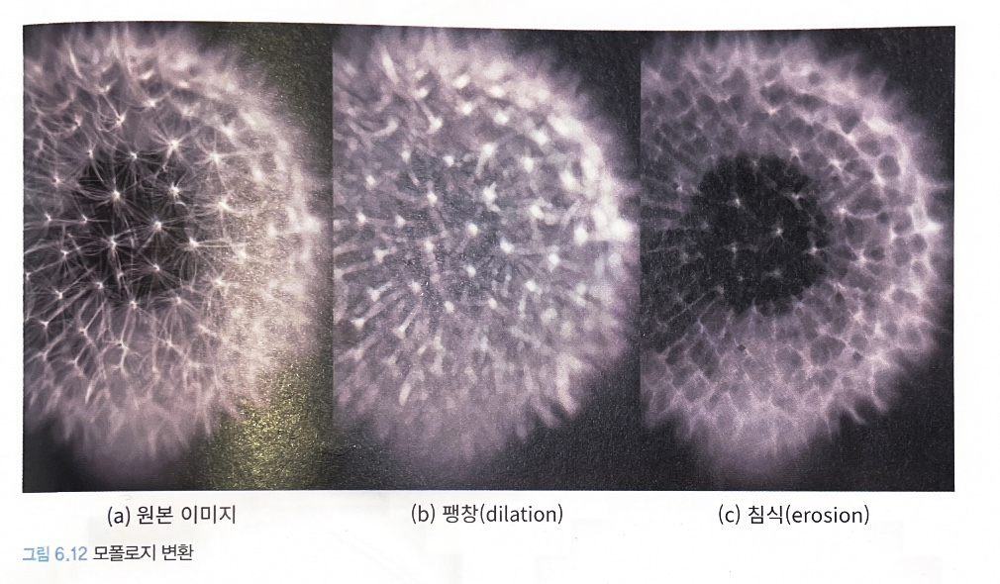

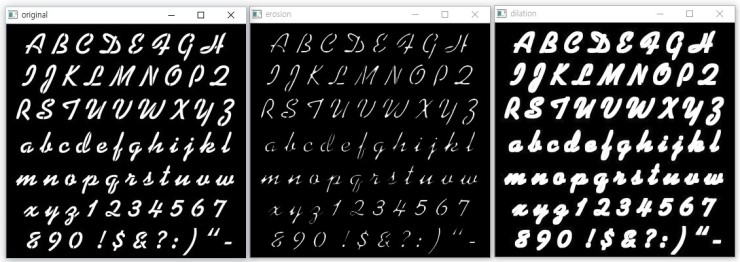

- 모폴로지 연산은 커널의 영향을 크게 받으며 커널의 형태에 따라 결과가 달라짐
- 커널보다 더 복잡한 개념인 구조 요소를 사용하며, 커널의 형태를 설정 할 수 있다.
- 커널은 직사각형이나 정사각형 구조로만 활용
- 구조 요소는 직사각형을 비롯해 타원, 십자 모양의 형태로도 활용 가능

In [2]:
import cv2

In [1]:
# Python OpenCV의 구조 요소 생성 함수
kernel = cv2.getStructuringElement(
    shape, # 커널의 형태(직사각형, 십자가, 타원)
    ksize, # 커널의 크기
    anchor = None # 고정점 위치(고정점을 할당하지 않을 경우 조금 더 유동적인 커널을 생성)
)

- 구조 요소의 형태에 따라 커널 내부 연산이 달라져서 제거되는 영역과 유지되는 영역이 달라짐

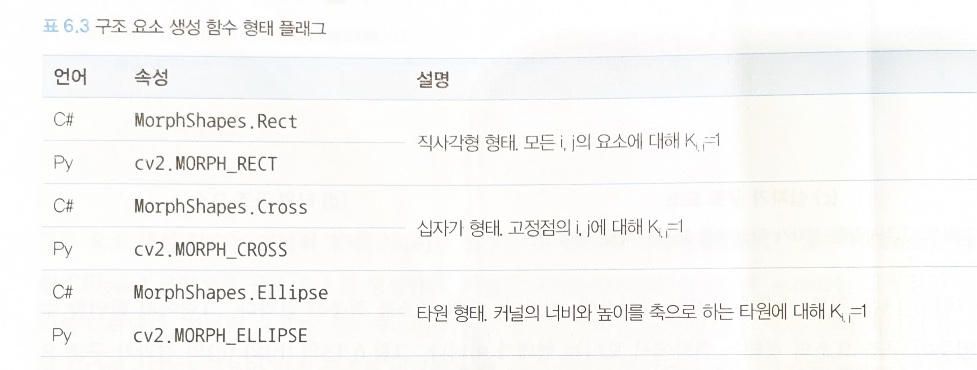

In [ ]:
# Python OpenCV의 팽창 함수
dst = cv2.dilate(
    src, # 입력 이미지
    kernel, # 구조 요소
    anchor = None, # 고정점
    iterations = None, # 반복 횟수(팽창 혹은 침식 함수가 몇 회 연산할지 설정)
    borderType = None, # 테두리 외삽법
    borderValue = None # 테두리 색상
)

In [ ]:
# Python OpenCV의 침식 함수
dst = cv2.erode(
    src,
    kernel,
    anchor = None,
    iterations = None,
    borderType = None,
    borderValue = None
)

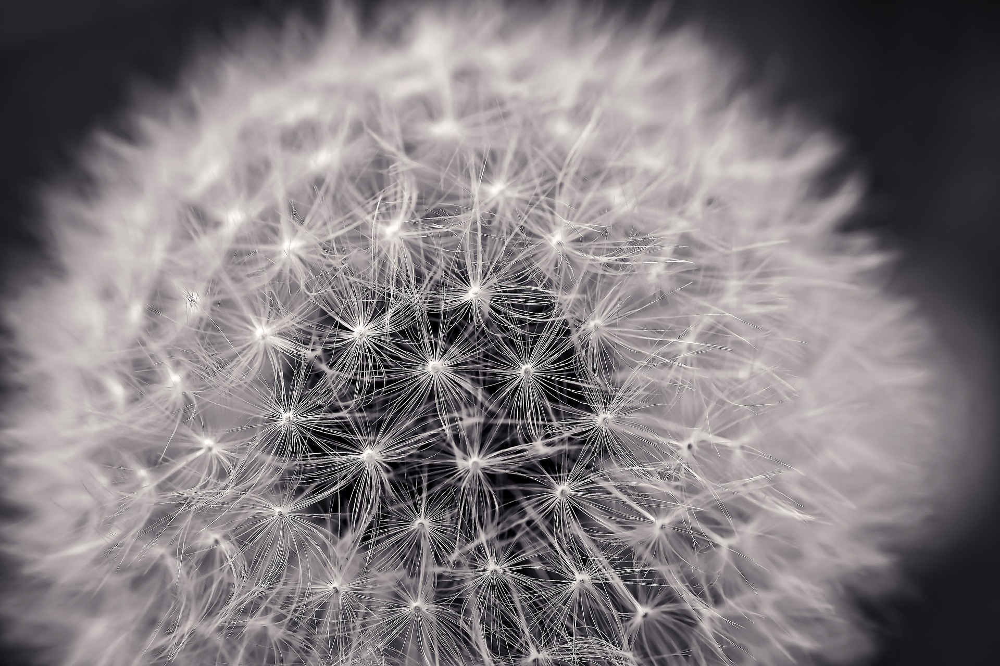

In [9]:
# 예제 6.10 Python OpenCV의 모폴로지 침식
import cv2

src = cv2.imread("dandelion.jpg", cv2.IMREAD_GRAYSCALE)

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5), anchor = (-1, -1))
                                # 구조요소(타원형태),  ksize     고정점

dst = cv2.erode(src, kernel, iterations=3)
                            # 침식 3회 연산

cv2.imshow("dst", dst)
cv2.waitKey(0)
cv2.destroyAllWindows()

---

## 6. 모폴로지 연산

- 모폴로지 연산은 모폴로지 변환 + 고급 형태학을 적용하는 변환 연산 이다.
- 입력 이미지가 이진화 된 이미지라면 팽창과 침식 연산으로도 우수한 결과를 얻는다.
- 하지만, 일반적인 이미지는 다중 채널 이미지를 이용하기 때문에 더 복잡한 연산이 필요하다.
- 이 때, 모폴로지 연산을 활용해 우수한 결과를 얻을 수 있다.

In [ ]:
# Python OpenCV의 모폴로지 연산 함수
dst = cv2.morphologyEx(
    src,
    op, # 연산자
    kernel,
    anchor = None,
    iterations = None,
    borderType = None,
    borderValue = None
)

- 연산자(op): 모폴로지 변환 함수를 조합해서 수행하는 복합 연산 방식
- 모폴로지 연산은 연산자 플래그를 변경해 다양한 방식으로 사용 가능

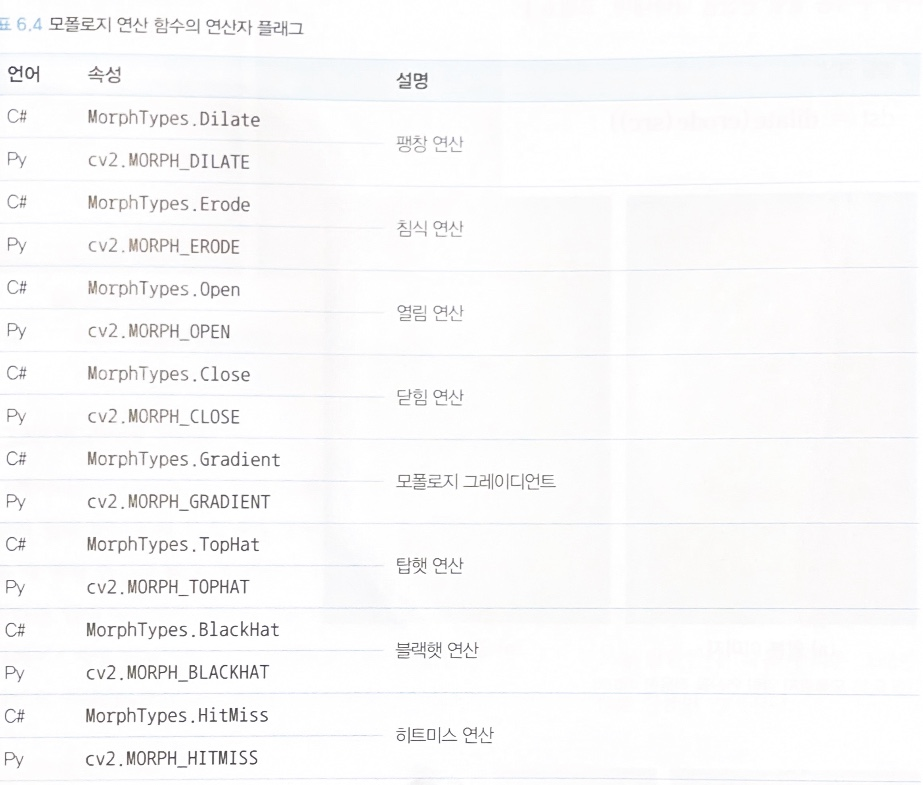

---

### 열림(Opening) 연산

- 팽창 연산자 + 침식 연산자의 조합. 침식 연산 이후 팽창 연산을 적용한다.
- 열림 연산을 적용하면 침식 연산으로 인해 밝은 영역이 줄어들고 어두운 영역이 늘어남
- 이 때, 줄어든 영역을 다시 복구하기 위해 팽창 연산을 적용하면 반대로 어두운 영역이 줄어들고 밝은 영역이 늘어남
- 이로 인해 스펙클이 사라지면서 발생한 객첵의 크기 감소를 원래대로 복구 가능

In [ ]:
dst = dilate(erode(src))

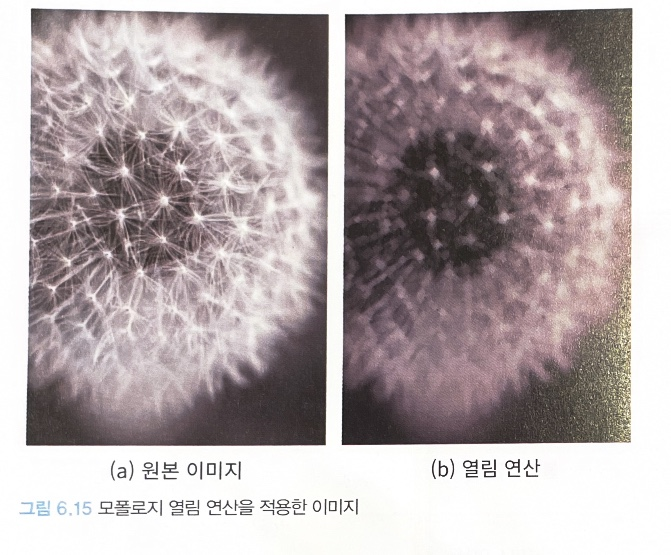

---

### 닫힘(closing) 연산

- 팽창 연산자 + 침식 연산자의 조합. 팽창 연산 후 침식 연산을 적용한다.
- 닫힘 연산을 적용하면 팽창 연산으로 인해 어두운 영역이 줄어들고 밝은 영역이 늘어남
- 늘어난 영역을 다시 복구하기 위해 침식 연산을 적용하면 반대로 밝은 영역이 줄어들고 어두운 영역이 늘어남
- 객체 내부의 홀이 사라지면서 발생한 크기 증가를 원대대로 복구 가능

In [ ]:
dst = erode(dilate(src))

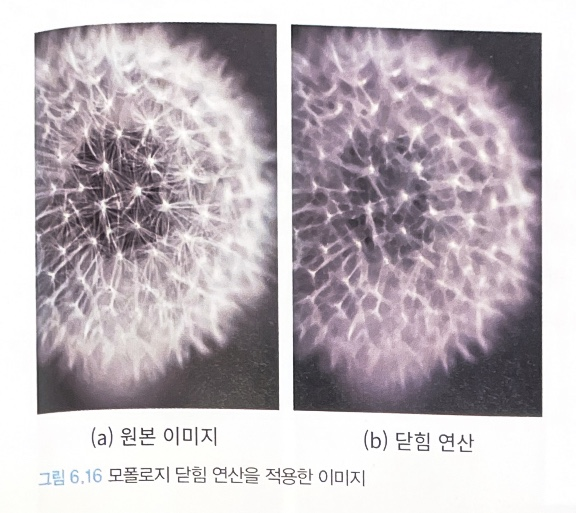

---

### 그레이디언트(Gradient) 연산

- 팽창 연산자 + 침식 연산자의 조합.
- 입력 이미지에 각각 팽창 연산과 침식 연산을 적용하고 감산을 진행
- 입력 이미지와 비교하면 팽창 연산은 밝은 영역이 더 크며, 침식 연산은 밝은 영역이 더 작다.
- 그레이디언트는 밝은 영역의 가장자리를 분리하며 그레이스케일 이미지가 가장 급격하게 변하는 곳에서 가장 높은 결과를 반환

In [ ]:
dst = dilate(src) - erode(src)

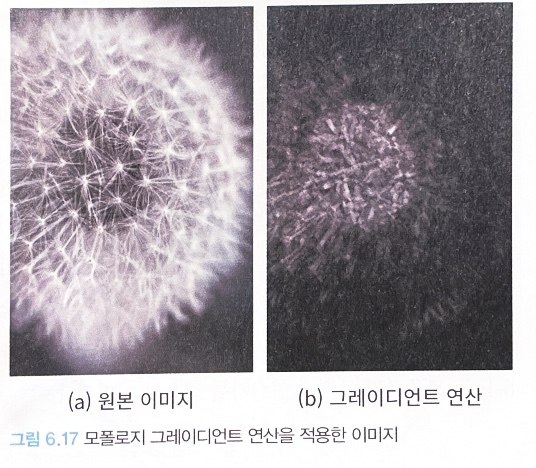

---

### 탑햇(TopHat) 연산

- 입력 이미지(src)와 열림(Opening)의 조합
- 그레이디언트 연산과 비슷하게 입력 이미지에 열림 연산을 적용한 이미지를 감산
- 밝은 영역이 분리되어 사라졌던 스펙클이나 작은 부분들이 표시됨
- 입력 이미지의 객체들이 제외되고 국소적으로 밝았던 부분들이 분리됨

In [ ]:
dst = src - open(src)

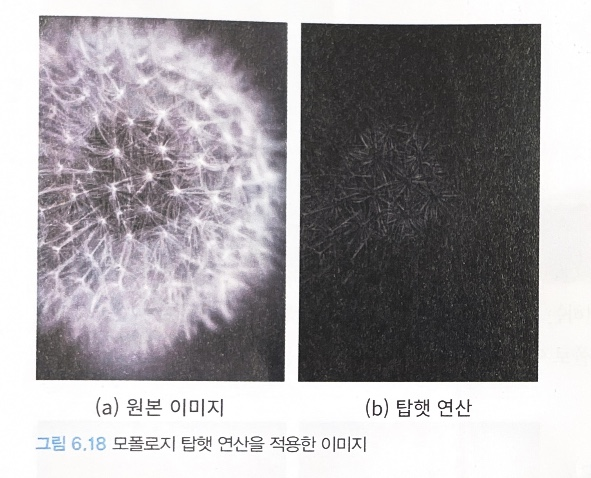

---

### 블랙햇(BlackHat) 연산

- 입력 이미지(src)와 닫힘(Closing)의 조합
- 닫힘 연산을 적용한 이미지에 입력 이미지를 감산
- 어두운 영역이 채워져 사라졌던 홀 등이 표시됨
- 입력 이미지의 객체들이 제외되고 국소적으로 어두웠던 홀들이 분리됨

In [ ]:
dst = close(src) - src

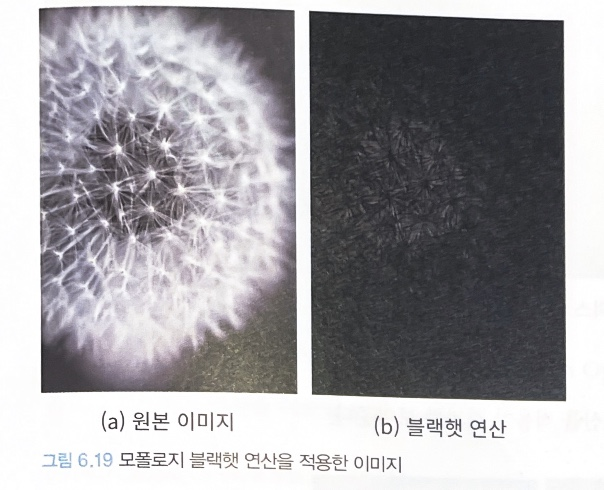

---

### 히트미스(HitMiss) 연산

- 히트미스 연산은 단일 채널 이미지에서 활용
- 주로 이진화 이미지에 적용
- 히트미스 연산은 이미지의 전경이나 배경 픽셀의 특정 패턴을 찾는 데 사용
- 구조 요소의 형태
- 내부 요소의 값은 0 혹은 1만 의미가 있다.      
- 0은 해당 픽셀을 무시한다. 
- 1은 해당 픽셀을 고려한다는 의미이다.     
- 이 특성 덕분에 히트미스 연산을 모서리를 검출하는 데 활용하기도 한다.

- 히트미스 제한 조건
    - 8-bit unsigned integers, 1-Channel

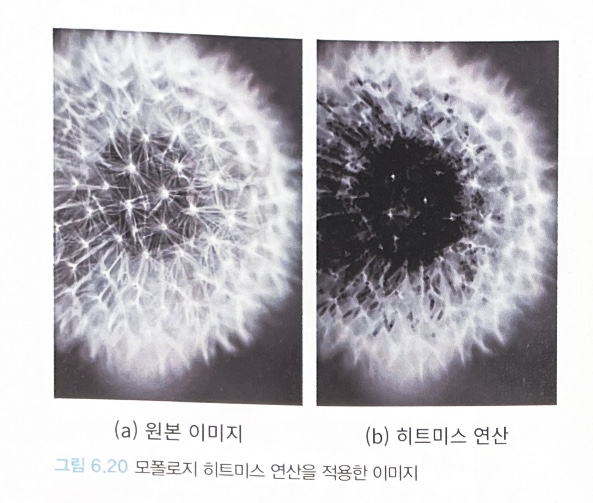

In [10]:
# Python OpenCV에서의 모폴로지 히트미스
import numpy as np
import cv2

src = cv2.imread("dandelion.jpg", cv2.IMREAD_GRAYSCALE)
_, binary = cv2.threshold(src, 127, 255, cv2.THRESH_BINARY)

kernel = np.array([[1, 0, 0, 0, 1],
                   [0, 1, 0, 1, 0],
                   [0, 0, 1, 0, 0],
                   [0, 1, 0, 1, 0],
                   [1, 0, 0, 0, 1]])

dst = cv2.morphologyEx(binary, cv2.MORPH_HITMISS, kernel, iterations=1)

cv2.imshow("dst", dst)
cv2.waitKey(0)
cv2.destroyAllWindows()